## Used Packges

In [20]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

## Load data and quick view on columns data types 

In [21]:
df = pd.read_csv("Students_Grading_Dataset.csv")

In [22]:
df.head()

,Student_ID,First_Name,Last_Name,Email,Gender,Age,Department,Attendance (%),Midterm_Score,Final_Score,...,Projects_Score,Total_Score,Grade,Study_Hours_per_Week,Extracurricular_Activities,Internet_Access_at_Home,Parent_Education_Level,Family_Income_Level,Stress_Level (1-10),Sleep_Hours_per_Night
0,S1000,Omar,Williams,student0@university.com,Female,22,Engineering,52.29,55.03,57.82,...,85.90,56.09,F,6.2,No,Yes,High School,Medium,5,4.7
1,S1001,Maria,Brown,student1@university.com,Male,18,Engineering,97.27,97.23,45.80,...,55.65,50.64,A,19.0,No,Yes,NaN,Medium,4,9.0
2,S1002,Ahmed,Jones,student2@university.com,Male,24,Business,57.19,67.05,93.68,...,73.79,70.30,D,20.7,No,Yes,Master's,Low,6,6.2
3,S1003,Omar,Williams,student3@university.com,Female,24,Mathematics,95.15,47.79,80.63,...,92.12,61.63,A,24.8,Yes,Yes,High School,High,3,6.7
4,S1004,John,Smith,student4@university.com,Female,23,CS,54.18,46.59,78.89,...,68.42,66.13,F,15.4,Yes,Yes,High School,High,2,7.1


In [23]:
GT = df.groupby('Grade')['Final_Score'].mean()
GT

Grade
A    69.127204
B    69.316973
C    69.199005
D    70.921249
F    69.992618
Name: Final_Score, dtype: float64

In [24]:
df.shape

(5000, 23)

In [25]:
df.columns

Index(['Student_ID', 'First_Name', 'Last_Name', 'Email', 'Gender', 'Age',
       'Department', 'Attendance (%)', 'Midterm_Score', 'Final_Score',
       'Assignments_Avg', 'Quizzes_Avg', 'Participation_Score',
       'Projects_Score', 'Total_Score', 'Grade', 'Study_Hours_per_Week',
       'Extracurricular_Activities', 'Internet_Access_at_Home',
       'Parent_Education_Level', 'Family_Income_Level', 'Stress_Level (1-10)',
       'Sleep_Hours_per_Night'],
      dtype='object')

In [26]:
df.dtypes

Student_ID                     object
First_Name                     object
Last_Name                      object
Email                          object
Gender                         object
Age                             int64
Department                     object
Attendance (%)                float64
Midterm_Score                 float64
Final_Score                   float64
Assignments_Avg               float64
Quizzes_Avg                   float64
Participation_Score           float64
Projects_Score                float64
Total_Score                   float64
Grade                          object
Study_Hours_per_Week          float64
Extracurricular_Activities     object
Internet_Access_at_Home        object
Parent_Education_Level         object
Family_Income_Level            object
Stress_Level (1-10)             int64
Sleep_Hours_per_Night         float64
dtype: object

# Data Preprocessing

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Student_ID                  5000 non-null   object 
 1   First_Name                  5000 non-null   object 
 2   Last_Name                   5000 non-null   object 
 3   Email                       5000 non-null   object 
 4   Gender                      5000 non-null   object 
 5   Age                         5000 non-null   int64  
 6   Department                  5000 non-null   object 
 7   Attendance (%)              4484 non-null   float64
 8   Midterm_Score               5000 non-null   float64
 9   Final_Score                 5000 non-null   float64
 10  Assignments_Avg             4483 non-null   float64
 11  Quizzes_Avg                 5000 non-null   float64
 12  Participation_Score         5000 non-null   float64
 13  Projects_Score              5000 

In [28]:
df.describe()

,Age,Attendance (%),Midterm_Score,Final_Score,Assignments_Avg,Quizzes_Avg,Participation_Score,Projects_Score,Total_Score,Study_Hours_per_Week,Stress_Level (1-10),Sleep_Hours_per_Night
count,5000.000000,4484.000000,5000.000000,5000.000000,4483.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000
mean,21.048400,75.431409,70.326844,69.640788,74.798673,74.910728,4.980024,74.924860,75.121804,17.658860,5.48080,6.488140
std,1.989786,14.372446,17.213209,17.238744,14.411799,14.504281,2.890136,14.423415,14.399941,7.275864,2.86155,1.452283
min,18.000000,50.010000,40.000000,40.000000,50.000000,50.030000,0.000000,50.010000,50.020000,5.000000,1.00000,4.000000
25%,19.000000,63.265000,55.457500,54.667500,62.090000,62.490000,2.440000,62.320000,62.835000,11.400000,3.00000,5.200000
50%,21.000000,75.725000,70.510000,69.735000,74.810000,74.695000,4.955000,74.980000,75.395000,17.500000,5.00000,6.500000
75%,23.000000,87.472500,84.970000,84.500000,86.970000,87.630000,7.500000,87.367500,87.652500,24.100000,8.00000,7.700000
max,24.000000,100.000000,99.980000,99.980000,99.980000,99.960000,10.000000,100.000000,99.990000,30.000000,10.00000,9.000000


In [29]:
df.describe(include='object')

,Student_ID,First_Name,Last_Name,Email,Gender,Department,Grade,Extracurricular_Activities,Internet_Access_at_Home,Parent_Education_Level,Family_Income_Level
count,5000,5000,5000,5000,5000,5000,5000,5000,5000,3206,5000
unique,5000,8,6,5000,2,4,5,2,2,4,3
top,S5999,Maria,Johnson,student4999@university.com,Male,CS,A,No,Yes,PhD,Low
freq,1,657,868,1,2551,2022,1495,3493,4485,820,1983


## check on duplicates

In [30]:
df.duplicated().sum()

np.int64(0)

In [31]:
for col in df.columns:
    print(f"Column '{col}': {df[col].duplicated().sum()} duplicates")


Column 'Student_ID': 0 duplicates
Column 'First_Name': 4992 duplicates
Column 'Last_Name': 4994 duplicates
Column 'Email': 0 duplicates
Column 'Gender': 4998 duplicates
Column 'Age': 4993 duplicates
Column 'Department': 4996 duplicates
Column 'Attendance (%)': 2019 duplicates
Column 'Midterm_Score': 1591 duplicates
Column 'Final_Score': 1629 duplicates
Column 'Assignments_Avg': 2006 duplicates
Column 'Quizzes_Avg': 1827 duplicates
Column 'Participation_Score': 4003 duplicates
Column 'Projects_Score': 1859 duplicates
Column 'Total_Score': 1829 duplicates
Column 'Grade': 4995 duplicates
Column 'Study_Hours_per_Week': 4749 duplicates
Column 'Extracurricular_Activities': 4998 duplicates
Column 'Internet_Access_at_Home': 4998 duplicates
Column 'Parent_Education_Level': 4995 duplicates
Column 'Family_Income_Level': 4997 duplicates
Column 'Stress_Level (1-10)': 4990 duplicates
Column 'Sleep_Hours_per_Night': 4949 duplicates


In [32]:
df.duplicated(subset=['First_Name', 'Last_Name', 'Total_Score', 'Grade' , 'Attendance (%)']).sum()


np.int64(0)

## Understanding the diversity in categorical columns to decide encoding strategy


In [33]:

for col in df.select_dtypes(include=['object']).columns:
    print(col, ":", df[col].nunique())


Student_ID : 5000
First_Name : 8
Last_Name : 6
Email : 5000
Gender : 2
Department : 4
Grade : 5
Extracurricular_Activities : 2
Internet_Access_at_Home : 2
Parent_Education_Level : 4
Family_Income_Level : 3


## Check on nulls and fill it

In [34]:
df.isnull().sum()

Student_ID                       0
First_Name                       0
Last_Name                        0
Email                            0
Gender                           0
Age                              0
Department                       0
Attendance (%)                 516
Midterm_Score                    0
Final_Score                      0
Assignments_Avg                517
Quizzes_Avg                      0
Participation_Score              0
Projects_Score                   0
Total_Score                      0
Grade                            0
Study_Hours_per_Week             0
Extracurricular_Activities       0
Internet_Access_at_Home          0
Parent_Education_Level        1794
Family_Income_Level              0
Stress_Level (1-10)              0
Sleep_Hours_per_Night            0
dtype: int64

In [35]:
for col in df.columns:
    nulls = df[col].isnull().sum() 
    if nulls > 0:
        print(col  ,  nulls , df[col].dtype )

Attendance (%) 516 float64
Assignments_Avg 517 float64
Parent_Education_Level 1794 object


In [36]:
df.drop(columns=['Parent_Education_Level'],inplace=True)

# Check on the skewness to fill nulls of numerical columns with mean or median 
for col in ['Attendance (%)' , 'Assignments_Avg']:
    skew = df[col].skew()
    if abs(skew) > 1 :
        df[col].fillna(df[col].median() , inplace=True)
        print(col , "Filled with : median ")
    else:
        df[col].fillna(df[col].mean() , inplace=True)
        print(col , "Filled with : mean ")


Attendance (%) Filled with : mean 
Assignments_Avg Filled with : mean 


C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\2694224713.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].mean() , inplace=True)


In [37]:
df.isnull().sum()


Student_ID                    0
First_Name                    0
Last_Name                     0
Email                         0
Gender                        0
Age                           0
Department                    0
Attendance (%)                0
Midterm_Score                 0
Final_Score                   0
Assignments_Avg               0
Quizzes_Avg                   0
Participation_Score           0
Projects_Score                0
Total_Score                   0
Grade                         0
Study_Hours_per_Week          0
Extracurricular_Activities    0
Internet_Access_at_Home       0
Family_Income_Level           0
Stress_Level (1-10)           0
Sleep_Hours_per_Night         0
dtype: int64

In [38]:
# Removing irrelevant identification columns that do not contribute to student performance analysis
df.drop(columns=['Student_ID', 'First_Name', 'Last_Name', 'Email'], inplace=True)

# Data Visualization

## Numerical features

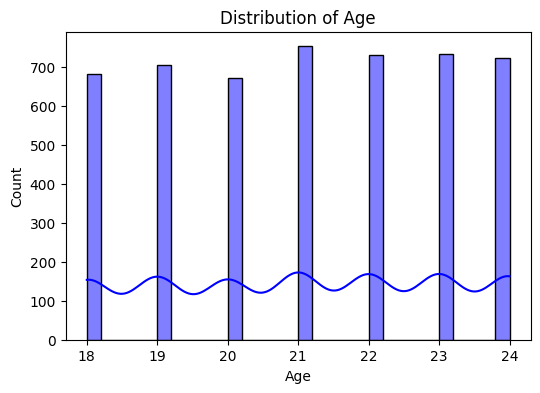

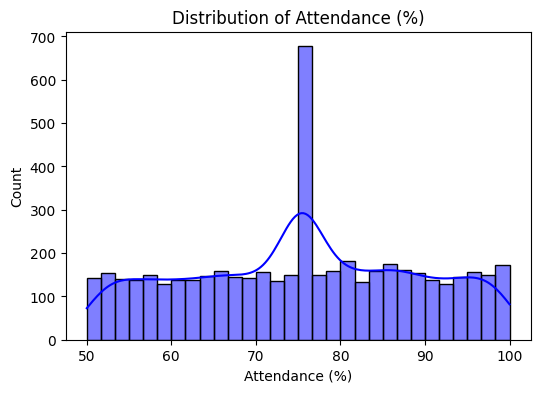

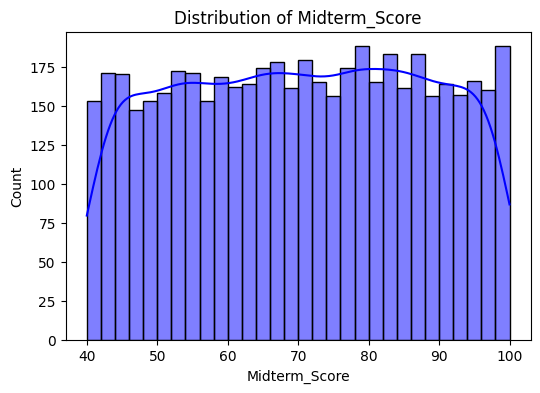

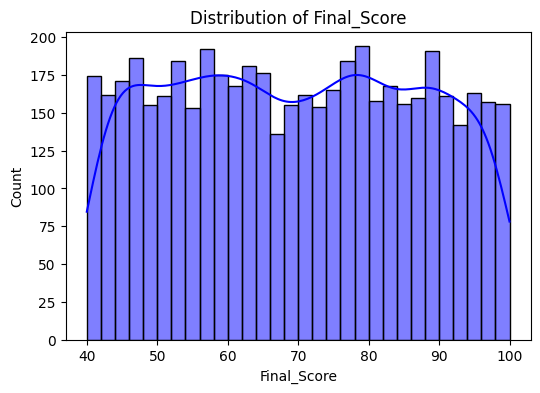

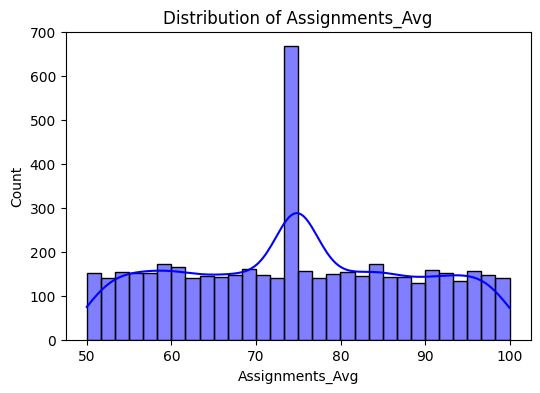

...

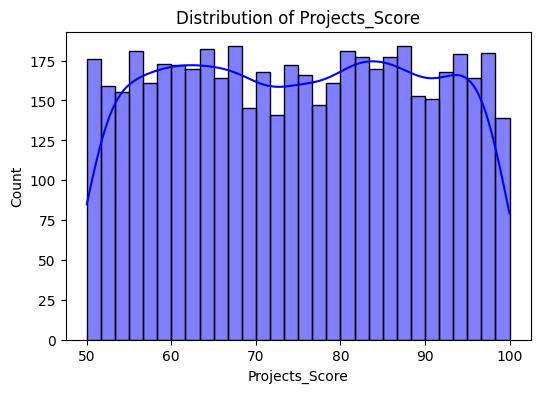

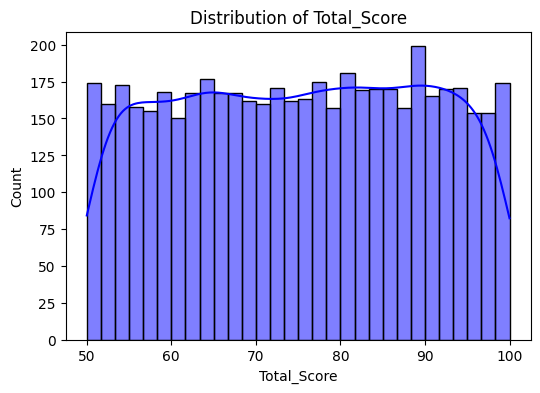

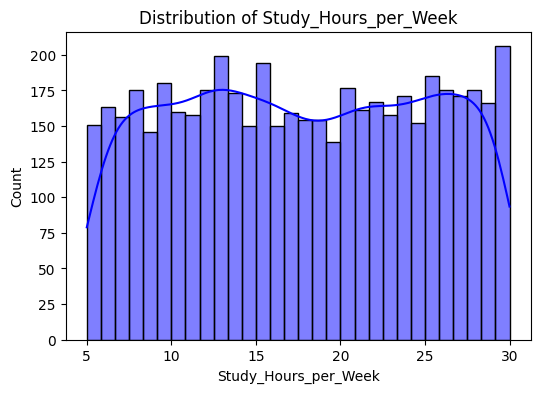

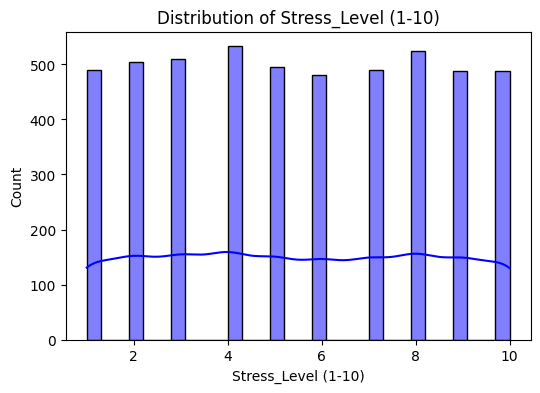

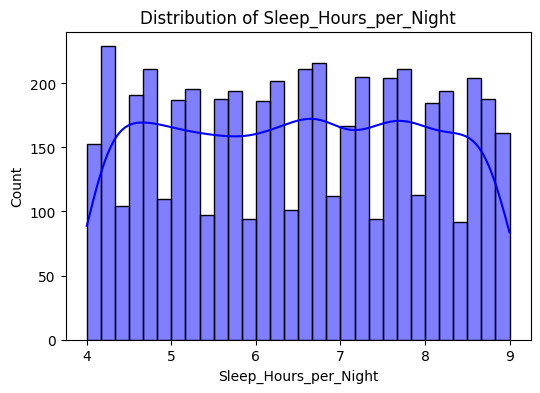

In [39]:
# Plotting the distribution of each numerical feature to understand its spread and detect skewness.
numerical_columns = df.select_dtypes(include=['number']).columns

for col in numerical_columns:
    plt.figure(figsize=(6, 4))
    sns.histplot(df[col], bins=30, kde=True, color='blue')
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Count")
    
    plt.show()

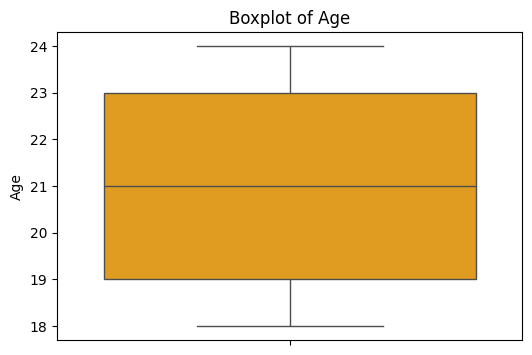

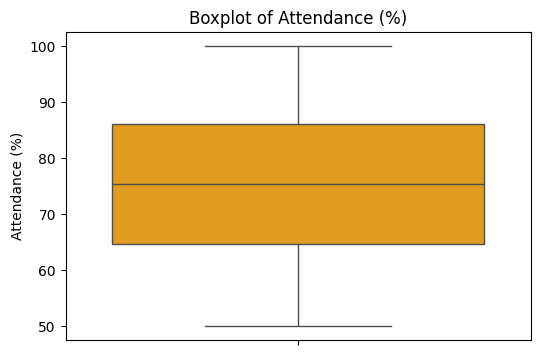

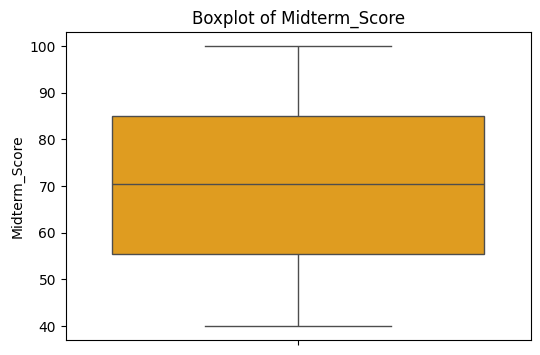

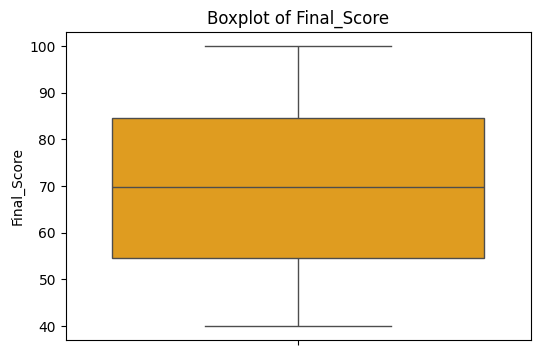

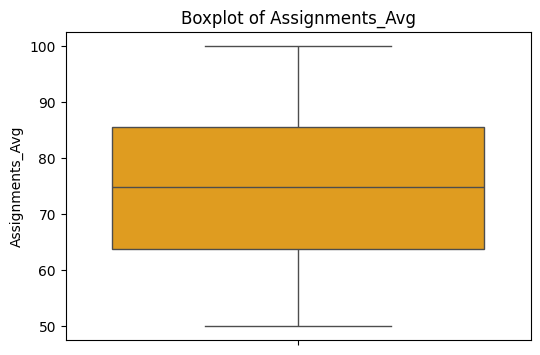

...

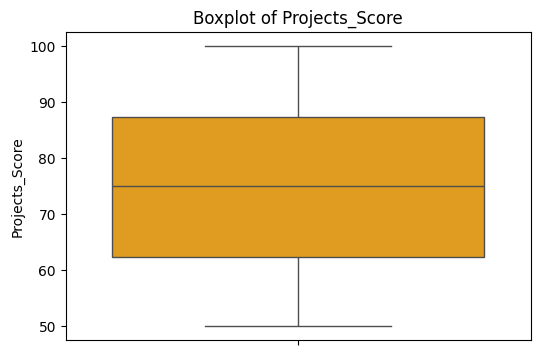

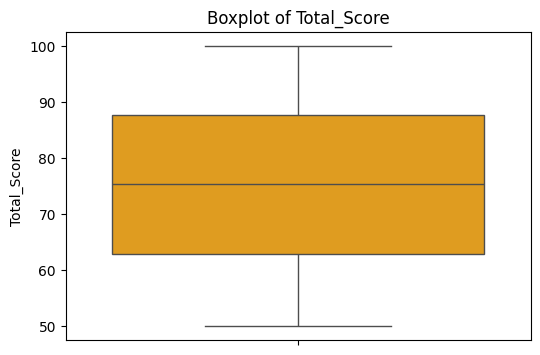

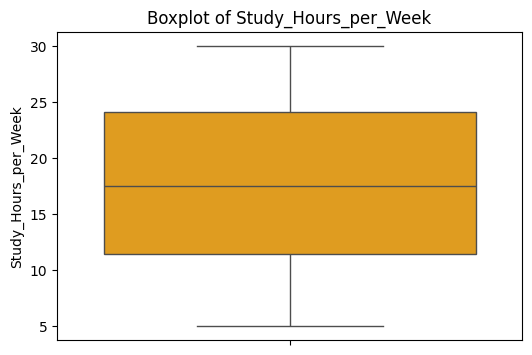

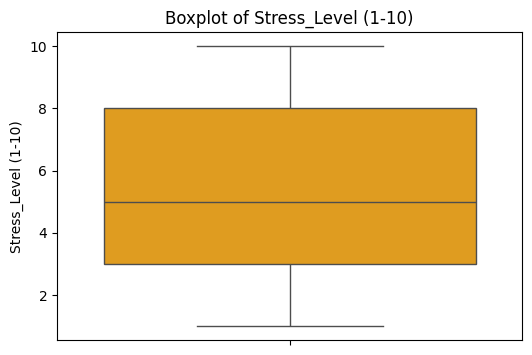

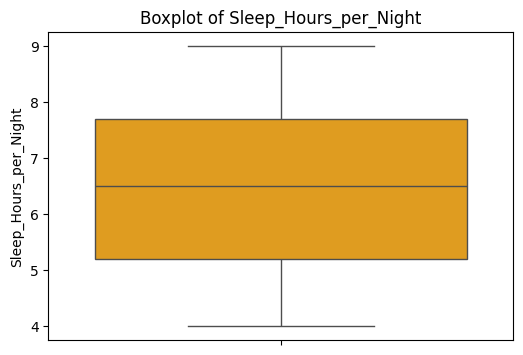

In [40]:
# Generate boxplots for all numerical columns to visualize distribution, spread, and outliers.
for col in numerical_columns:
    plt.figure(figsize=(6, 4))
    sns.boxplot(y=df[col], color='orange')
    plt.title(f"Boxplot of {col}")
    plt.ylabel(col)
    plt.show()


## Categorical features

C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\4131977850.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, palette='viridis')


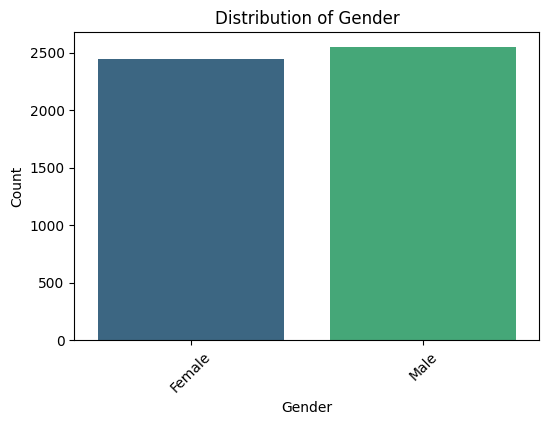

C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\4131977850.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, palette='viridis')


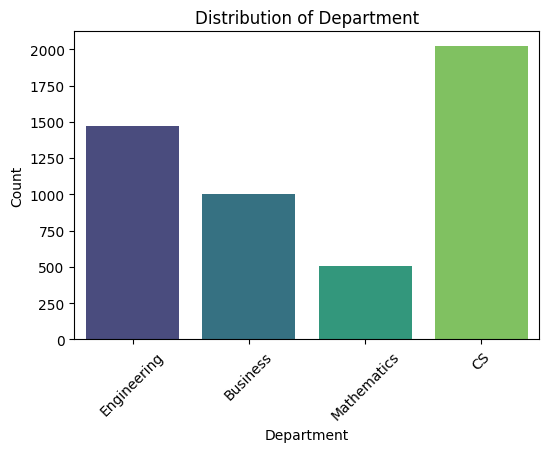

C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\4131977850.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, palette='viridis')


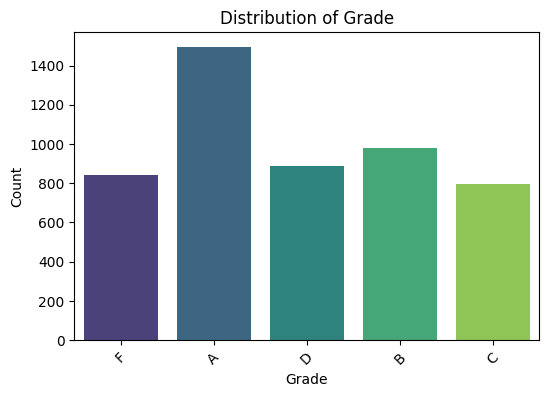

C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\4131977850.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, palette='viridis')


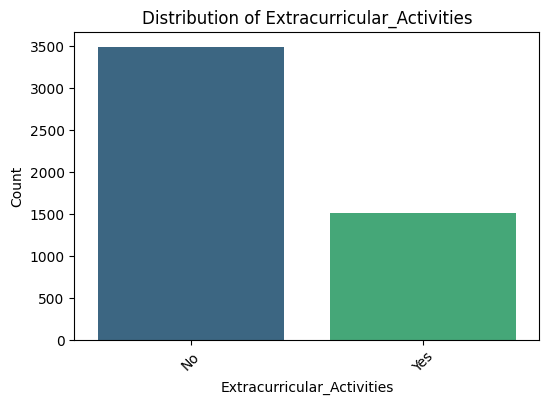

C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\4131977850.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, palette='viridis')


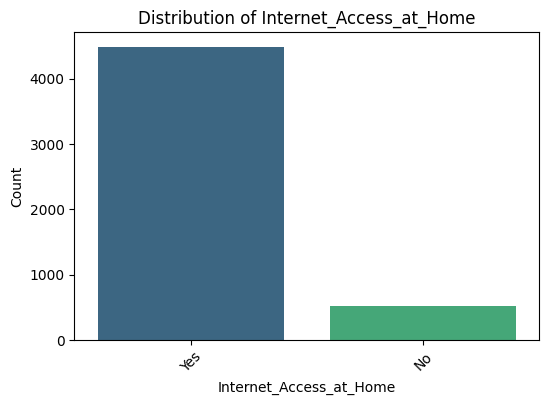

C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\4131977850.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, palette='viridis')


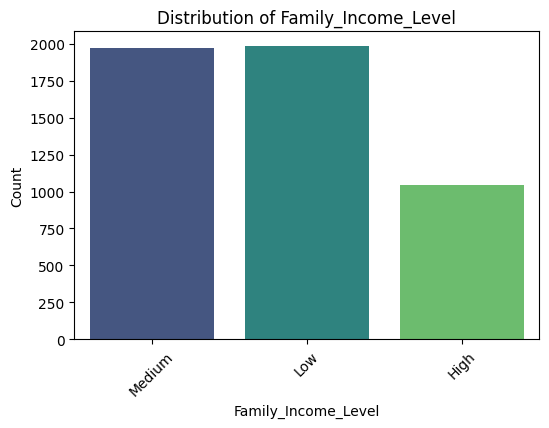

In [41]:
# Visualizing the distribution of categorical features to identify class imbalances and frequency of each category.
categorical_columns = df.select_dtypes(include=['object']).columns

for col in categorical_columns:
    plt.figure(figsize=(6, 4))
    sns.countplot(data=df, x=col, palette='viridis')  
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.xticks(rotation=45)  
    
    plt.show()

## Relationship Between Categorical and Numerical Features

C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\3886531655.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette='Set2', ax=axes[i])
C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\3886531655.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette='Set2', ax=axes[i])
C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\3886531655.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette='Set2', ax=axes[i])


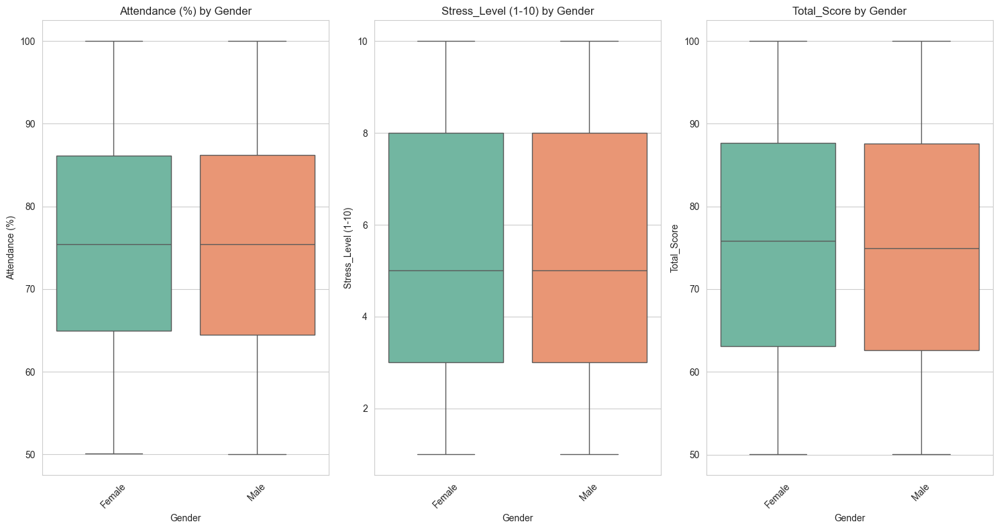

C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\3886531655.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette='Set2', ax=axes[i])
C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\3886531655.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette='Set2', ax=axes[i])
C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\3886531655.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette='Set2', ax=axes[i])


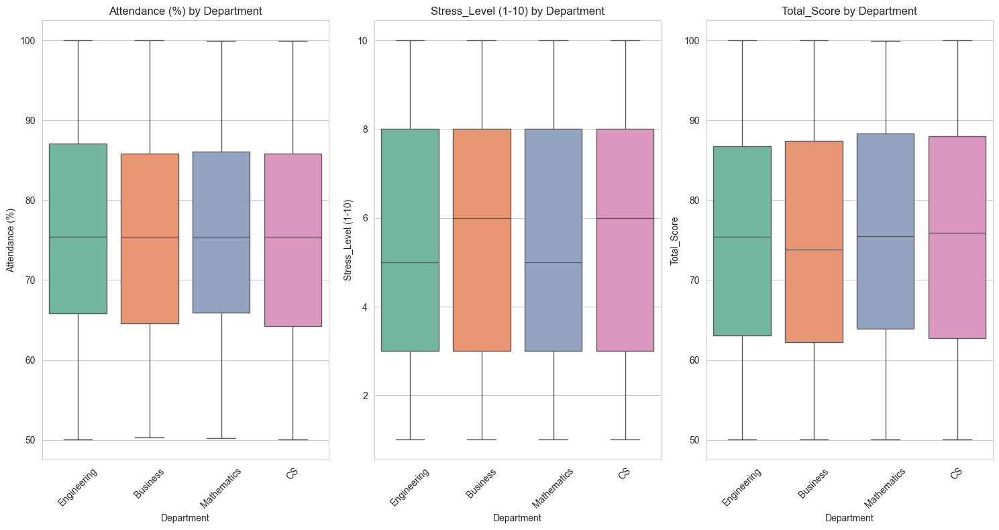

C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\3886531655.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette='Set2', ax=axes[i])
C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\3886531655.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette='Set2', ax=axes[i])
C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\3886531655.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette='Set2', ax=axes[i])


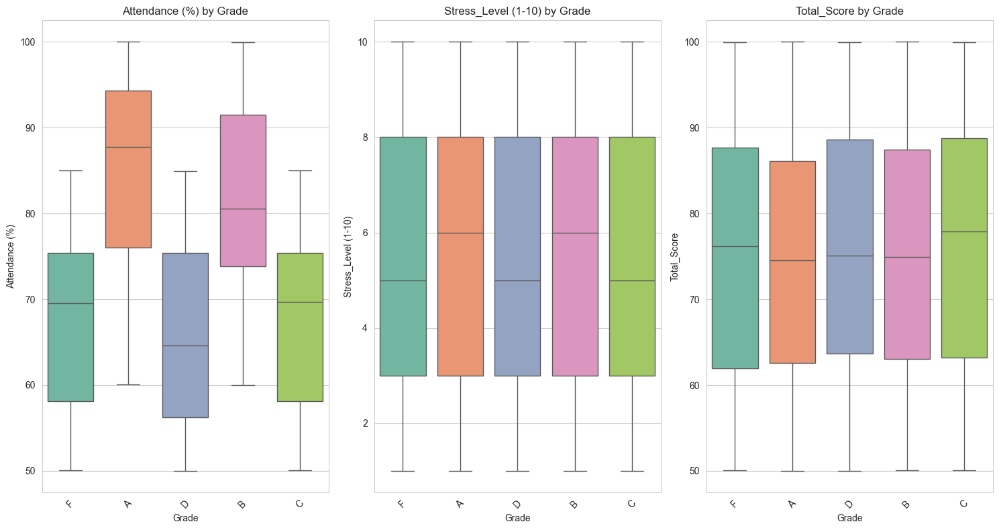

C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\3886531655.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette='Set2', ax=axes[i])
C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\3886531655.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette='Set2', ax=axes[i])
C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\3886531655.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette='Set2', ax=axes[i])


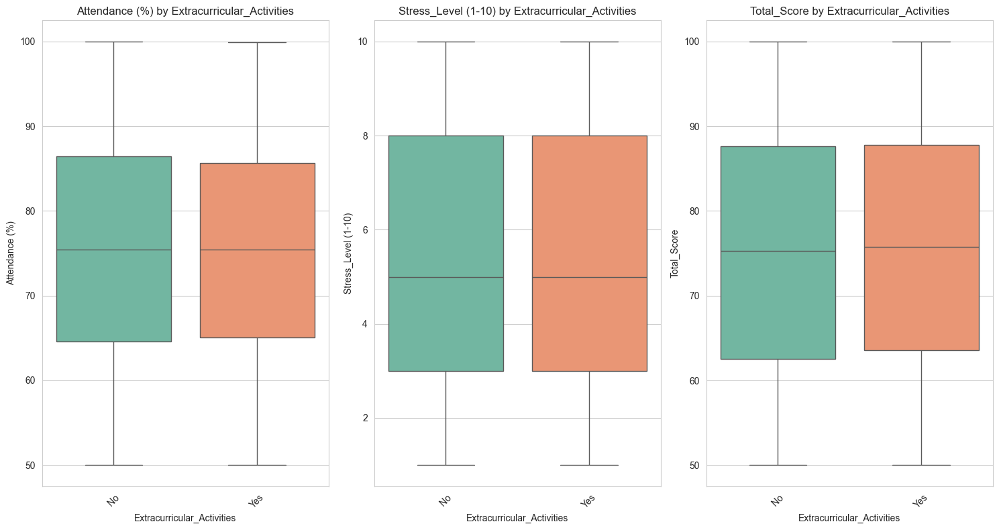

C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\3886531655.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette='Set2', ax=axes[i])
C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\3886531655.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette='Set2', ax=axes[i])
C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\3886531655.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette='Set2', ax=axes[i])


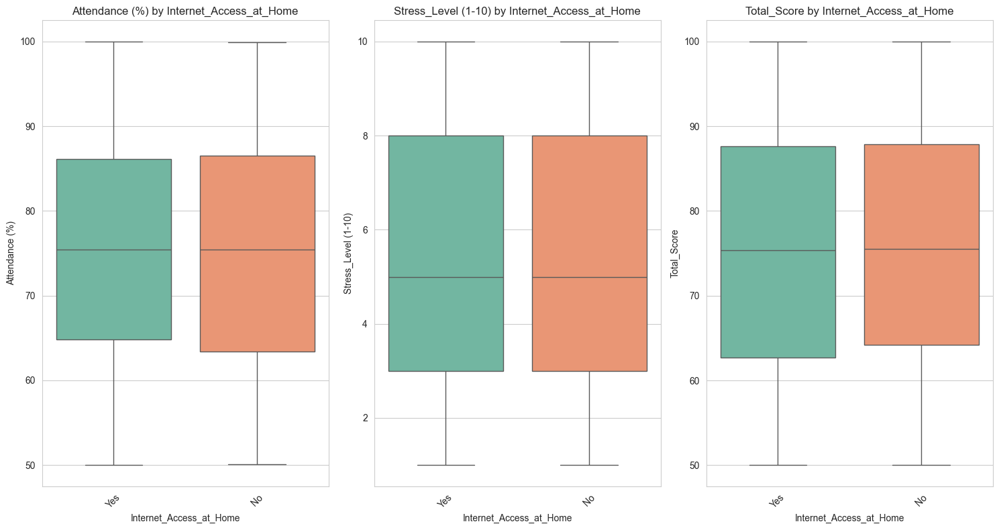

C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\3886531655.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette='Set2', ax=axes[i])
C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\3886531655.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette='Set2', ax=axes[i])
C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\3886531655.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette='Set2', ax=axes[i])


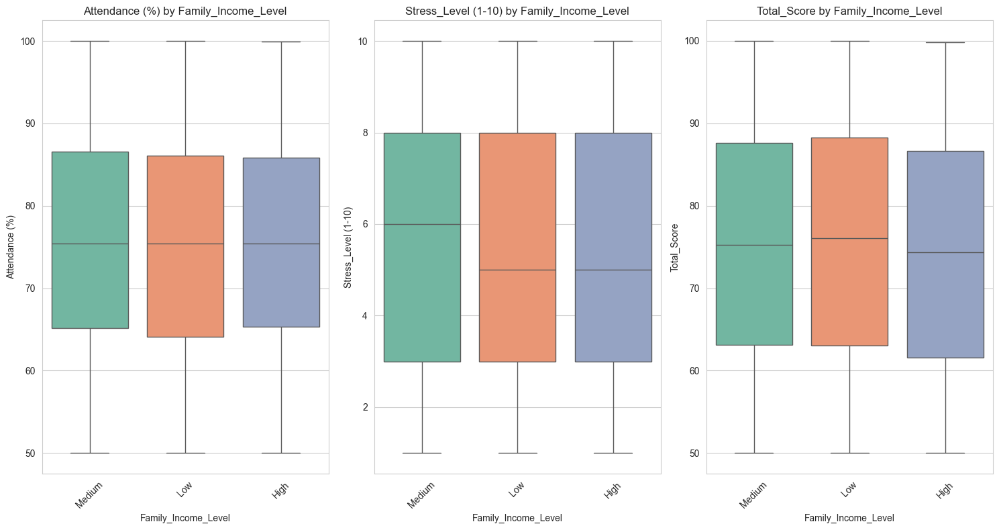

In [45]:
# Creating boxplots to analyze the relationship between categorical and numerical features.
numerical_features = ['Attendance (%)', 'Stress_Level (1-10)', 'Total_Score']

for cat_col in categorical_columns:
    fig, axes = plt.subplots(1, len(numerical_features), figsize=(15, 8))  

    for i, num_col in enumerate(numerical_features):
        sns.boxplot(x=df[cat_col], y=df[num_col], palette='Set2', ax=axes[i])
        axes[i].set_title(f"{num_col} by {cat_col}")
        axes[i].set_xlabel(cat_col)
        axes[i].set_ylabel(num_col)
        axes[i].tick_params(axis='x', rotation=45)  
        
    plt.tight_layout()  
    plt.show()

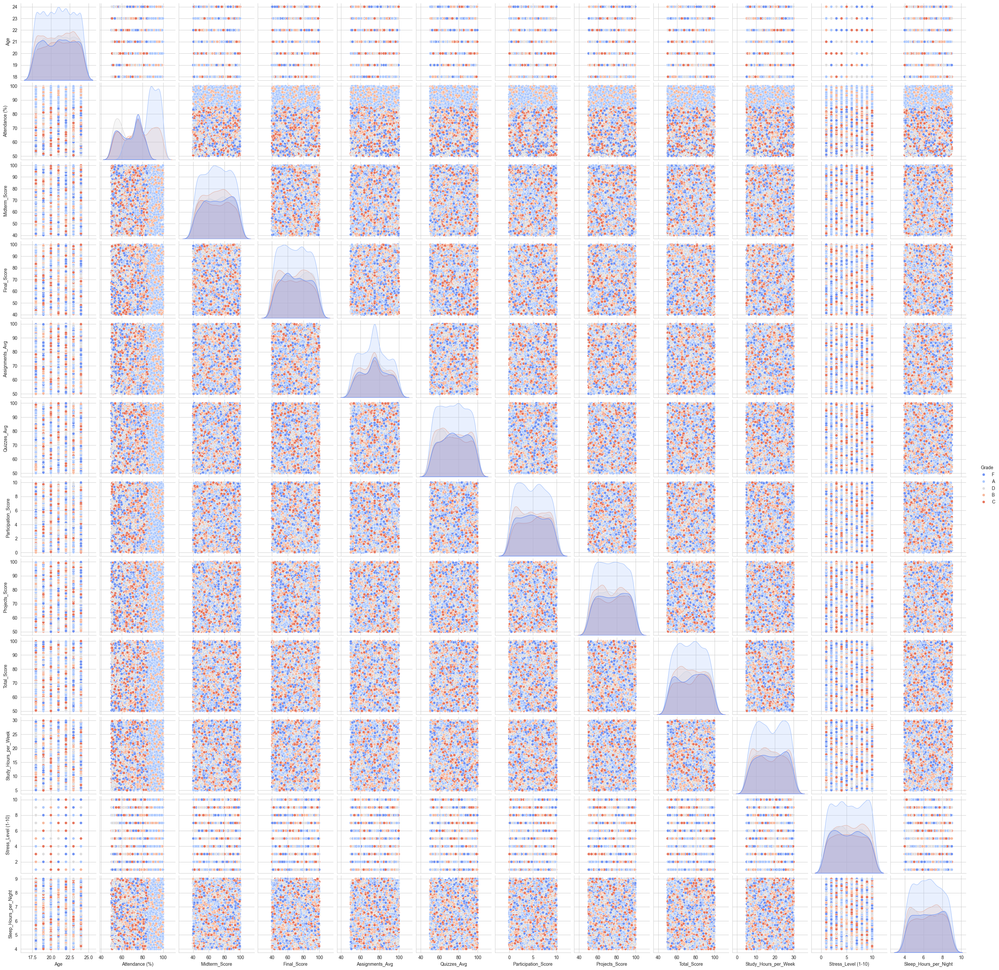

In [46]:
# Generating a pairplot to visualize relationships between numerical featur
sns.pairplot(df, hue='Grade', diag_kind='kde', palette='coolwarm')
plt.show()


## Encoding

In [47]:
# Applying one-hot encoding to convert categorical features into numerical format.
df = pd.get_dummies(df, columns=['Gender', 'Department', 'Extracurricular_Activities', 'Internet_Access_at_Home'], dtype=int)

In [48]:
df['Grade'].unique()

array(['F', 'A', 'D', 'B', 'C'], dtype=object)

In [49]:
df['Family_Income_Level'].unique()

array(['Medium', 'Low', 'High'], dtype=object)

In [50]:
# Performing manual label encoding for Grade and Family_Income_Level categories.
grade_mapping = {'A': 4, 'B': 3, 'C': 2, 'D': 1, 'F': 0}
income_mapping = {'High': 2, 'Medium': 1, 'Low': 0}

df['Grade'] = df['Grade'].map(grade_mapping)
df['Family_Income_Level'] = df['Family_Income_Level'].map(income_mapping)

print("Grade Encoding:")
for key, value in sorted(grade_mapping.items(), key=lambda x: x[1]):  
    print(f"{key} → {value}")

print("\nFamily_Income_Level Encoding:")
for key, value in sorted(income_mapping.items(), key=lambda x: x[1]):  
    print(f"{key} → {value}")

print("\nEncoded Data Sample:")
print(df[['Grade', 'Family_Income_Level']].head())

Grade Encoding:
F → 0
D → 1
C → 2
B → 3
A → 4

Family_Income_Level Encoding:
Low → 0
Medium → 1
High → 2

Encoded Data Sample:
   Grade  Family_Income_Level
0      0                    1
1      4                    1
2      1                    0
3      4                    2
4      0                    2


## Correlation Analysis and Feature Relationships with Grade

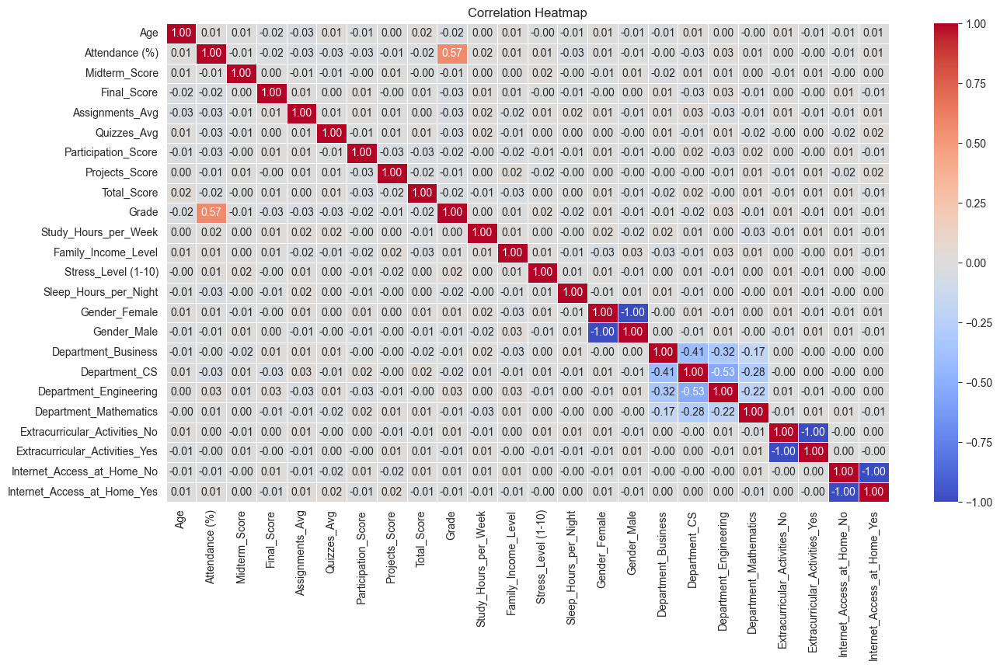

In [51]:
# Computing the correlation matrix for numerical features and visualizing it using a heatmap.
numeric_df = df.select_dtypes(include=['number'])  
correlation_matrix = numeric_df.corr()  

plt.figure(figsize=(15, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

In [52]:
# Sorting and displaying the absolute correlation values of features with Grade.
grade_correlations = df.corr().abs()['Grade'].sort_values(ascending=False)
print("\nCorrelations with Grade:\n", grade_correlations)


Correlations with Grade:
 Grade                             1.000000
Attendance (%)                    0.572927
Department_Engineering            0.032308
Quizzes_Avg                       0.029829
Final_Score                       0.028252
Assignments_Avg                   0.026071
Stress_Level (1-10)               0.024795
Total_Score                       0.023628
Age                               0.018937
Sleep_Hours_per_Night             0.018178
Participation_Score               0.017419
Department_CS                     0.016200
Gender_Female                     0.014591
Gender_Male                       0.014591
Midterm_Score                     0.014109
Projects_Score                    0.013770
Department_Mathematics            0.013068
Extracurricular_Activities_No     0.009251
Extracurricular_Activities_Yes    0.009251
Department_Business               0.007072
Family_Income_Level               0.006339
Internet_Access_at_Home_No        0.005241
Internet_Access_at_Home_Yes

C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\2207480038.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=grade_correlations.index, y=grade_correlations.abs().values, palette='coolwarm')


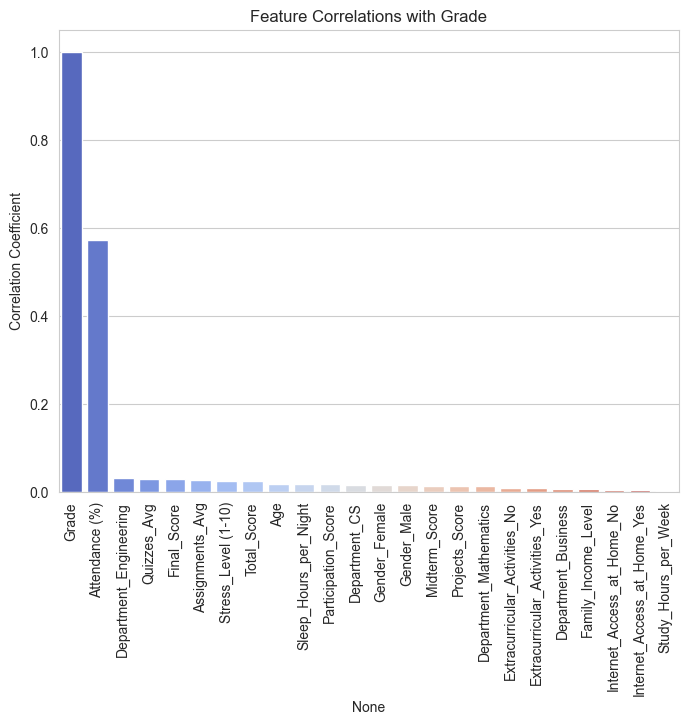

In [53]:
# Visualizing the correlation between features and Grade using a bar plot.
plt.figure(figsize=(8, 6))
sns.barplot(x=grade_correlations.index, y=grade_correlations.abs().values, palette='coolwarm')
plt.xticks(rotation=90)
plt.title("Feature Correlations with Grade")
plt.ylabel("Correlation Coefficient")
plt.show()

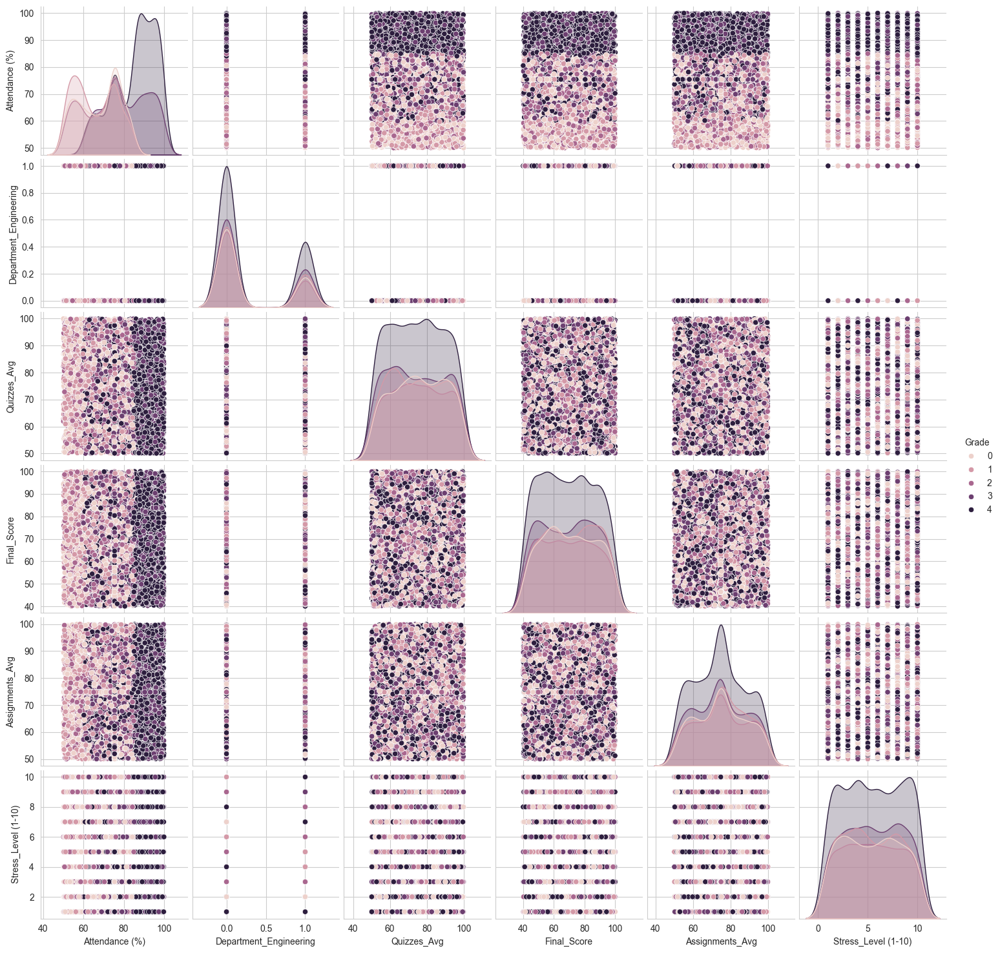

In [54]:
# Generating a pairplot to analyze the relationships between the top correlated features and Grade.
key_features = grade_correlations.abs().sort_values(ascending=False).index[1:7]  
sns.pairplot(df, vars=key_features, hue='Grade', diag_kind='kde')
plt.show()

In [56]:
# Reverse mapping for Grade and Family_Income_Level
reverse_grade_mapping = {v: k for k, v in grade_mapping.items()}

df['Grade'] = df['Grade'].map(reverse_grade_mapping)

print("\nReversed Encoding Data Sample:")
print(df[['Grade']].head())



Reversed Encoding Data Sample:
  Grade
0     F
1     A
2     D
3     A
4     F


C:\Users\Remo\AppData\Local\Temp\ipykernel_19352\1115139502.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df['Grade'], y=df['Attendance (%)'], palette='coolwarm')


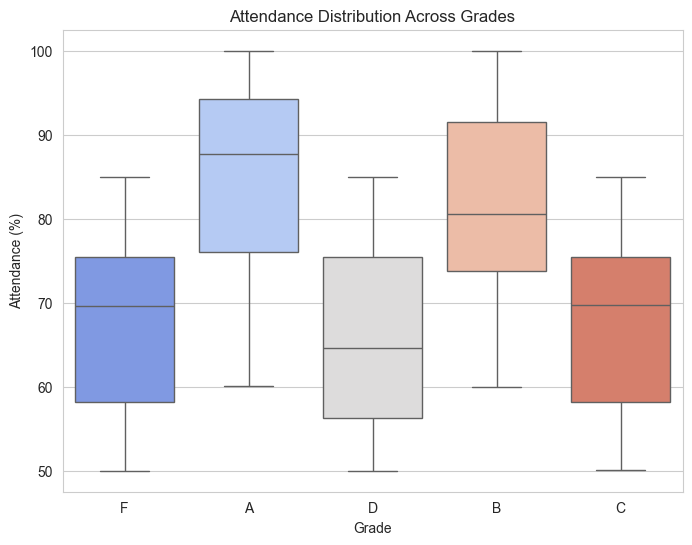

In [57]:
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['Grade'], y=df['Attendance (%)'], palette='coolwarm')
plt.title("Attendance Distribution Across Grades")
plt.xlabel("Grade")
plt.ylabel("Attendance (%)")
plt.show()

# Export data to CSV File 

In [ ]:
df.to_csv("data_cleaned.csv")